In [1]:
import tensorflow as tf
from tensorflow.keras.utils import load_img, array_to_img, img_to_array, save_img
import cv2
import os
import shutil
import pathlib
import numpy as np
import matplotlib.pyplot as plt

## Image Enhancement

This notebook will carry out an image enhancement procedure for all the retina fundus images. The steps of the procedure are defined as:

<ol>
<li>Reading a noisy fundus image</li>
<li>Decomposing the image into individual color channels, Red, Green, Blue</li>
<li>Applying a denoising filter to each channel</li>
<li>Applying CLAHE to each channel</li>
<li>Merging all the channels</li>
</ol>

In [2]:
data_path = "../../../Data/retinal-lesions-v20191227/images_896x896/"

### 1. Test on arbitrary image

In [345]:
test_image = "229_right.jpg"
test_image_path = os.path.join(data_path, test_image)

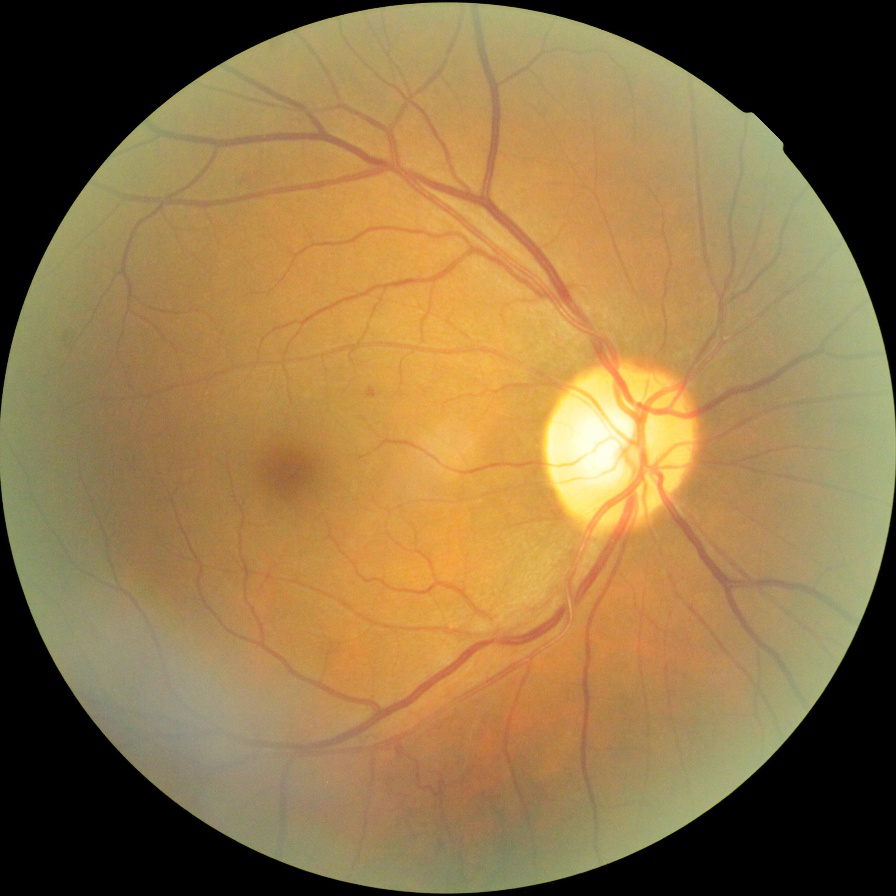

In [346]:
image = load_img(test_image_path )
image

In [347]:
image = cv2.imread(test_image_path)

image_red_channel = image[:,:, 2]
image_green_channel = image[:,:, 1]
image_blue_channel = image[:,:, 0]

In [348]:
all_channels = np.concatenate((image_red_channel, image_green_channel, image_blue_channel), axis=1)
all_channels = np.expand_dims(all_channels, axis=-1)
all_channels = array_to_img(all_channels, scale=False)

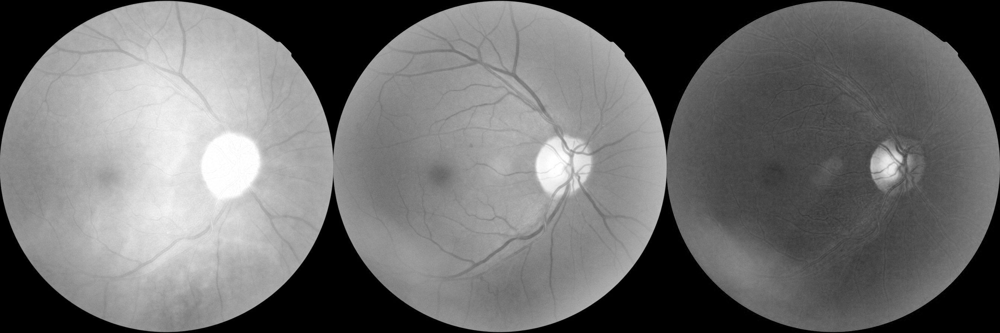

In [349]:
all_channels

#### 1.1 Applying the median filter to each channel

In [350]:
median_red_channel = cv2.medianBlur(image_red_channel, 5)
median_blue_channel = cv2.medianBlur(image_blue_channel, 5)
median_green_channel = cv2.medianBlur(image_green_channel,5)

In [351]:
all_channels_median = np.concatenate((median_red_channel, median_green_channel, median_blue_channel), axis=1)
all_channels_median = np.expand_dims(all_channels_median, axis=-1)
all_channels_median = array_to_img(all_channels_median, scale=False)

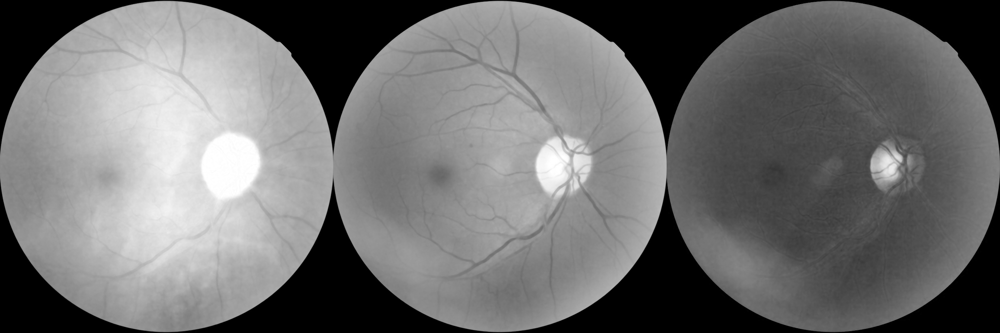

In [352]:
all_channels_median

#### 1.2 Applying CLAHE to each channel

In [353]:
image_bw = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [354]:
clahe = cv2.createCLAHE(clipLimit=6, tileGridSize=(8,8))

In [355]:
clahe_red_channel = clahe.apply(median_red_channel)
clahe_green_channel = clahe.apply(median_green_channel)
clahe_blue_channel = clahe.apply(median_blue_channel)

In [356]:
clahe_all_channels = np.concatenate((clahe_red_channel, clahe_green_channel, clahe_blue_channel), axis=1)
clahe_all_channels = np.expand_dims(clahe_all_channels, axis=-1)
clahe_all_channels = array_to_img(clahe_all_channels)

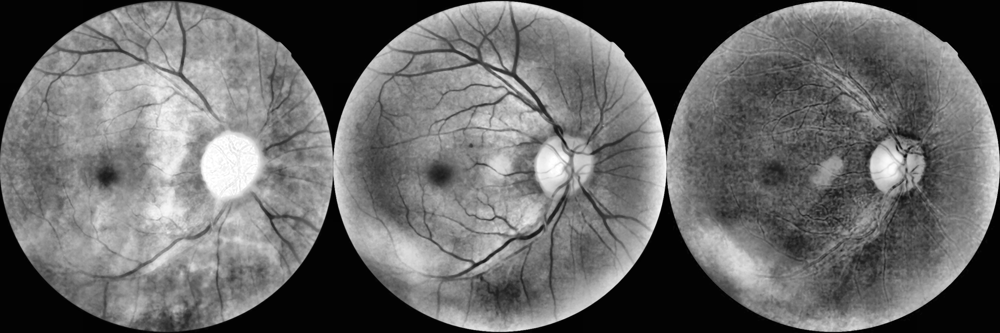

In [357]:
clahe_all_channels

#### 1.3 Merging the channels

In [358]:
#Expanding the dimensionality of the individual channels
clahe_red_channel = np.expand_dims(clahe_red_channel, axis = -1)
clahe_green_channel = np.expand_dims(clahe_green_channel, axis = -1)
clahe_blue_channel = np.expand_dims(clahe_blue_channel, axis = -1)

In [359]:
enhanced_image = np.concatenate((clahe_red_channel, clahe_green_channel, clahe_blue_channel), axis =-1)
enhanced_image = array_to_img(enhanced_image)

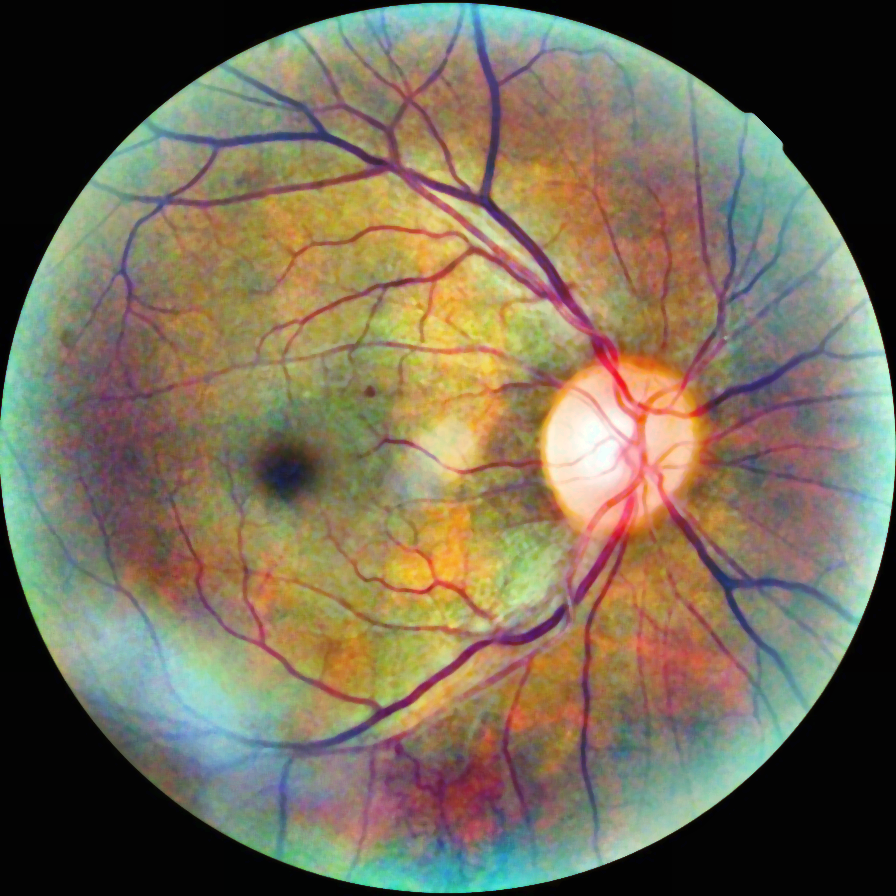

In [360]:
enhanced_image

### 2 Testing method 2 on arbitrary image

This image only applies the transformations to the green channel

In [361]:
image_green_channel.shape

(896, 896)

In [362]:
image_red_channel = np.expand_dims(image_red_channel, axis=-1)
image_blue_channel = np.expand_dims(image_blue_channel, axis=-1)
clahe_only_green = np.concatenate((image_red_channel, clahe_green_channel, image_blue_channel), axis = -1)

In [363]:
clahe_only_green.shape

(896, 896, 3)

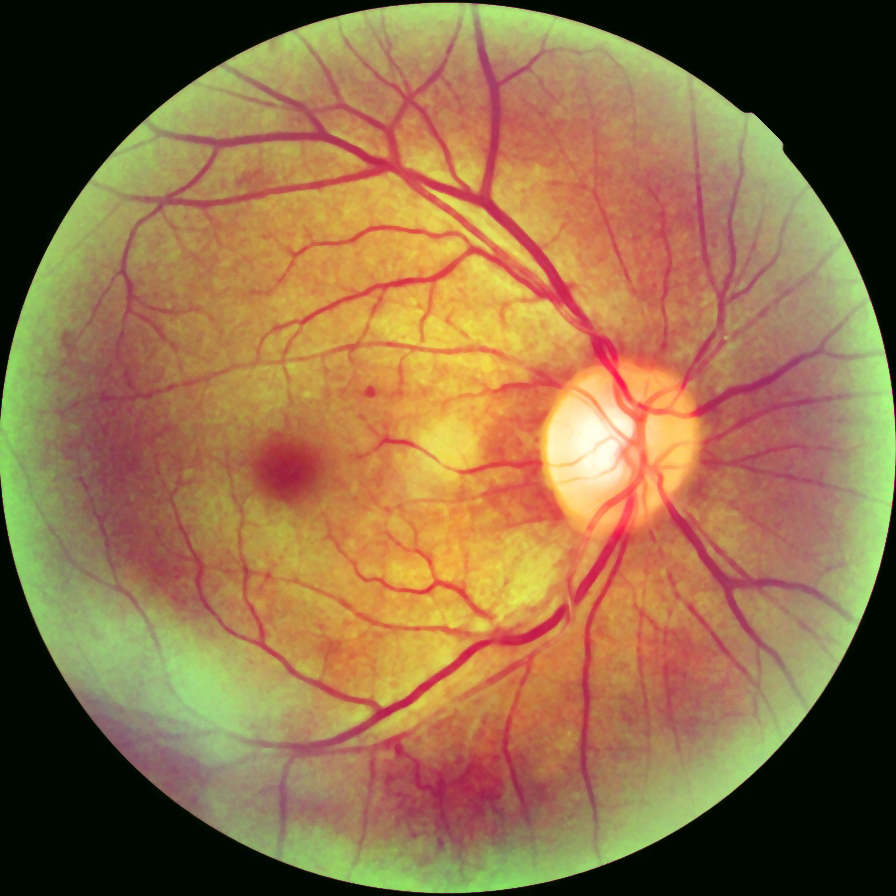

In [364]:
clahe_only_green = array_to_img(clahe_only_green)
clahe_only_green

In [365]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [366]:
gap = np.zeros((896, 20, 3))

In [367]:
lab_enhanced_image  = image_enhancement_three(test_image_path)
lab_enhanced_image = img_to_array(lab_enhanced_image)

In [368]:
enhanced_image_arr = img_to_array(enhanced_image)
clahe_only_green_arr = img_to_array(clahe_only_green)

comparison = np.concatenate((image, gap,enhanced_image_arr, gap,clahe_only_green_arr, gap, lab_enhanced_image), axis=1)
comparison = array_to_img(comparison)

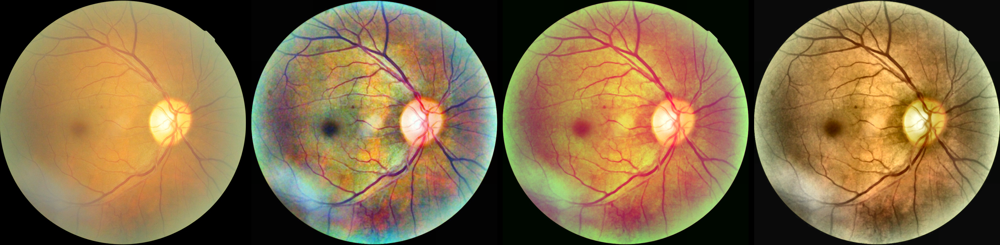

In [369]:
comparison

### 3 Applying method 1 to all training images

In [2]:
clahe = cv2.createCLAHE(clipLimit=6, tileGridSize=(8,8))

def image_enhancement_one(file_name):

    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    #Extracting The Color Channels
    image_red_channel = image[:,:, 0]
    image_green_channel = image[:,:, 1]
    image_blue_channel = image[:,:, 2]

    #Applying the median filter on each channel to reduce the noise
    median_red_channel = cv2.medianBlur(image_red_channel, 5)
    median_green_channel = cv2.medianBlur(image_green_channel, 5)
    median_blue_channel = cv2.medianBlur(image_blue_channel, 5)

    #Applying CLAHE on each channel
    clahe_red_channel = clahe.apply(median_red_channel)
    clahe_green_channel = clahe.apply(median_green_channel)
    clahe_blue_channel = clahe.apply(median_blue_channel)

    #Expanding the dimensionality so each channel is an individual channel is a grayscale image
    clahe_red_channel = np.expand_dims(clahe_red_channel, axis = -1)
    clahe_green_channel = np.expand_dims(clahe_green_channel, axis = -1)
    clahe_blue_channel = np.expand_dims(clahe_blue_channel, axis = -1)

    #Merging the channels
    enhanced_image = np.concatenate((clahe_red_channel, clahe_green_channel, clahe_blue_channel), axis =-1)
    enhanced_image = array_to_img(enhanced_image)

    return enhanced_image

def image_enhancement_two(file_name):

    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    #Extracting The Color Channels
    image_red_channel = image[:,:, 0]
    image_green_channel = image[:,:, 1]
    image_blue_channel = image[:,:, 2]

    #Applying the median filter on the green channel to reduce the noise

    median_green_channel = cv2.medianBlur(image_green_channel, 5)


    #Applying CLAHE on the green channel

    clahe_green_channel = clahe.apply(median_green_channel)


    #Expanding the dimensionality so each channel is an individual channel is a grayscale image
    image_red_channel = np.expand_dims(image_red_channel, axis = -1)
    clahe_green_channel = np.expand_dims(clahe_green_channel, axis = -1)
    image_blue_channel = np.expand_dims(image_blue_channel, axis = -1)

    #Merging the channels
    enhanced_image = np.concatenate((image_red_channel, clahe_green_channel, image_blue_channel), axis =-1)
    enhanced_image = array_to_img(enhanced_image)

    return enhanced_image
    



In [3]:
def image_enhancement_three(file_name):

    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    #Extracting The Color Channels
    image_l_channel = image[:,:, 0]
    image_a_channel = image[:,:, 1]
    image_b_channel = image[:,:, 2]

    #Applying the median filter on each channel to reduce the noise
    median_l_channel = cv2.medianBlur(image_l_channel, 5)
    median_a_channel = cv2.medianBlur(image_a_channel, 5)
    median_b_channel = cv2.medianBlur(image_b_channel, 5)

    #Applying CLAHE on each channel

    clahe_l_channel = clahe.apply(median_l_channel)


    #Expanding the dimensionality so each channel is an individual channel is a grayscale image
    clahe_l_channel = np.expand_dims(clahe_l_channel, axis = -1)
    median_a_channel = np.expand_dims(median_a_channel, axis = -1)
    median_b_channel = np.expand_dims(median_b_channel, axis = -1)

    #Merging the channels
    enhanced_image = np.concatenate((clahe_l_channel, median_a_channel, median_b_channel), axis =-1)
    enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_LAB2RGB)
    enhanced_image = array_to_img(enhanced_image)

    return enhanced_image

In [280]:
target_path_1 = "../../../Data/retinal-lesions-v20191227/enhancement_one/"
target_path_2 = "../../../Data/retinal-lesions-v20191227/enhancement_two"

os.mkdir(target_path_1)
os.mkdir(target_path_2)

In [340]:
target_path_3 = "../../../Data/retinal-lesions-v20191227/enhancement_three/"
os.mkdir(target_path_3)

In [4]:
data_path = "../../../Data/IDRID/segmentation_ds/images"

target_path_1 = "../../../Data/IDRID/segmentation_ds/enhancement_one/"
target_path_2 = "../../../Data/IDRID/segmentation_ds/enhancement_two/"
target_path_3 = "../../../Data/IDRID/segmentation_ds/enhancement_three/"

In [6]:
os.mkdir(target_path_1)
os.mkdir(target_path_2)
os.mkdir(target_path_3)

#### 3.2 Enhancing the base images using the enhancement methods

In [8]:
#Enhancement_one
for fn in os.listdir(data_path):
    
    image_path = os.path.join(data_path, fn)
    enhanced_image = image_enhancement_one(image_path)
    image_dest = os.path.join(target_path_1, fn)
    save_img(image_dest, enhanced_image)
    

In [9]:
#Enhancement_two
for fn in os.listdir(data_path):
    
    image_path = os.path.join(data_path, fn)
    enhanced_image = image_enhancement_two(image_path)
    image_dest = os.path.join(target_path_2, fn)
    save_img(image_dest, enhanced_image)

In [7]:
#Enhancement_three
for fn in os.listdir(data_path):
    
    image_path = os.path.join(data_path, fn)
    enhanced_image = image_enhancement_three(image_path)
    image_dest = os.path.join(target_path_3, fn)
    save_img(image_dest, enhanced_image)